In [16]:
# Import required libraries
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
from datetime import datetime
from typing import List, Tuple, Dict
from concurrent.futures import ThreadPoolExecutor

import cv2
import re

# Configure matplotlib for better display
plt.rcParams['figure.figsize'] = (16, 8)
plt.rcParams['figure.dpi'] = 100

print("Libraries imported successfully!")

Libraries imported successfully!


## 1. Define Dataset Paths

In [ ]:
# Dataset paths
DATASET1_PATH = '/data/common/STEREOSTUDYIPSL/Datasets/gQg5IUvV/PROJECTED'
DATASET2_PATH = '/data/common/STEREOSTUDYIPSL/Datasets/OdnkTZQ8/PROJECTED'

# Histogram matching configuration
USE_HISTOGRAM_MATCHING = False  # Set to True to enable histogram matching

print(f"Histogram matching: {'ENABLED' if USE_HISTOGRAM_MATCHING else 'DISABLED'}")
print()

# Check if paths exist
print(f"Dataset 1 (Reprojected) exists: {os.path.exists(DATASET1_PATH)}")
print(f"Dataset 2 (Reprojected) exists: {os.path.exists(DATASET2_PATH)}")

if os.path.exists(DATASET1_PATH):
    print(f"\nDataset 1 contents: {os.listdir(DATASET1_PATH)[:5]}...")
if os.path.exists(DATASET2_PATH):
    print(f"Dataset 2 contents: {os.listdir(DATASET2_PATH)[:5]}...")

Dataset 1 (Reprojected) exists: True
Dataset 2 (Reprojected) exists: True

Dataset 1 contents: ['20250406044600_01.jpg', '20250406044800_01.jpg', '20250406045000_01.jpg', '20250406045200_01.jpg', '20250406045400_01.jpg']...
Dataset 2 contents: ['image_20250406050000.jpg', 'image_20250406050030.jpg', 'image_20250406050130.jpg', 'image_20250406050100.jpg', 'image_20250406050200.jpg']...


## 2. Load Image Lists

In [53]:
def find_images(directory, extensions=['*.png', '*.jpg', '*.jpeg', '*.jp2', '*.tiff', '*.bmp']):
    """Find all image files in directory and subdirectories."""
    image_files = []
    for ext in extensions:
        # Search recursively
        pattern = os.path.join(directory, '**', ext)
        image_files.extend(glob.glob(pattern, recursive=True))
    return sorted(image_files)

# Load image lists
dataset1_images = find_images(DATASET1_PATH)
dataset2_images = find_images(DATASET2_PATH)

print(f"Dataset 1 (Reprojected): {len(dataset1_images)} images found")
print(f"Dataset 2 (Raw): {len(dataset2_images)} images found")

# Show first few images
if dataset1_images:
    print("\nFirst 5 Dataset 1 images:")
    for img in dataset1_images[:5]:
        print(f"  {os.path.basename(img)}")

if dataset2_images:
    print("\nFirst 5 Dataset 2 images:")
    for img in dataset2_images[:5]:
        print(f"  {os.path.basename(img)}")

Dataset 1 (Reprojected): 427 images found
Dataset 2 (Raw): 1441 images found

First 5 Dataset 1 images:
  20250406044600_01.jpg
  20250406044800_01.jpg
  20250406045000_01.jpg
  20250406045200_01.jpg
  20250406045400_01.jpg

First 5 Dataset 2 images:
  image_20250406050000.jpg
  image_20250406050030.jpg
  image_20250406050100.jpg
  image_20250406050130.jpg
  image_20250406050200.jpg


## 3. Image Loading Functions

In [54]:
def load_image(filepath):
    """Load an image file and return as numpy array."""
    try:
        img = Image.open(filepath)
        return np.array(img)
    except Exception as e:
        print(f"Error loading {filepath}: {e}")
        return None

def get_image_info(filepath):
    """Get basic information about an image."""
    try:
        img = Image.open(filepath)
        return {
            'filename': os.path.basename(filepath),
            'path': filepath,
            'size': img.size,
            'mode': img.mode,
            'format': img.format,
            'filesize_mb': os.path.getsize(filepath) / (1024*1024)
        }
    except Exception as e:
        return {'error': str(e)}

# Test loading
if dataset1_images:
    print("Dataset 1 sample image info:")
    info = get_image_info(dataset1_images[0])
    for key, value in info.items():
        print(f"  {key}: {value}")

if dataset2_images:
    print("\nDataset 2 sample image info:")
    info = get_image_info(dataset2_images[0])
    for key, value in info.items():
        print(f"  {key}: {value}")

Dataset 1 sample image info:
  filename: 20250406044600_01.jpg
  path: /data/common/STEREOSTUDYIPSL/Datasets/gQg5IUvV/PROJECTED/20250406044600_01.jpg
  size: (2464, 2464)
  mode: RGB
  format: JPEG
  filesize_mb: 0.3779945373535156

Dataset 2 sample image info:
  filename: image_20250406050000.jpg
  path: /data/common/STEREOSTUDYIPSL/Datasets/OdnkTZQ8/PROJECTED/image_20250406050000.jpg
  size: (1024, 1024)
  mode: RGB
  format: JPEG
  filesize_mb: 0.11267948150634766


## 4. Display Images Side by Side

Displaying first image pair...


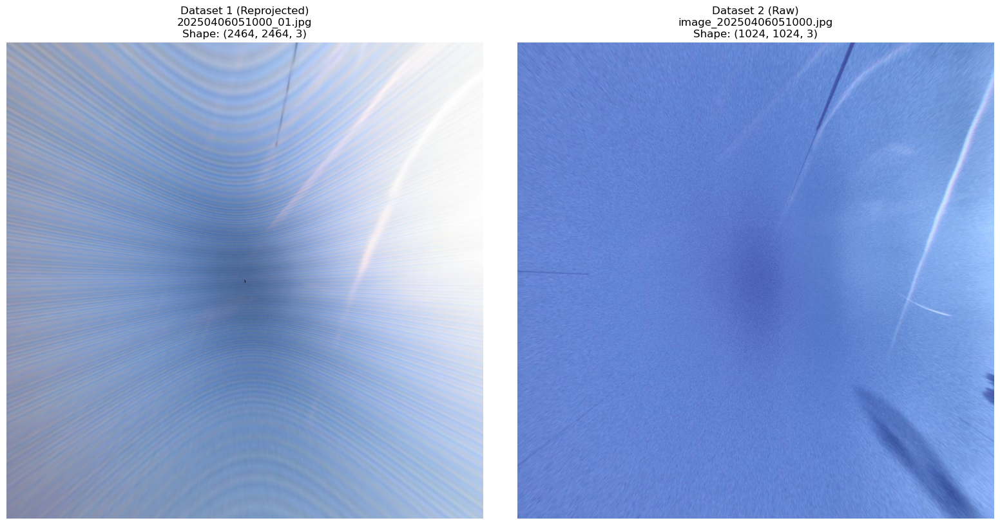

Displaying first image pair...


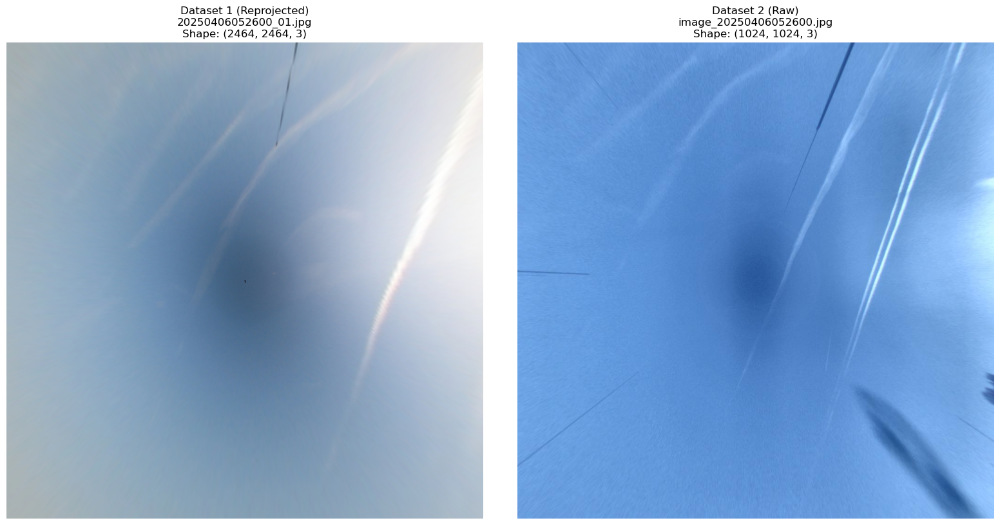

Displaying first image pair...


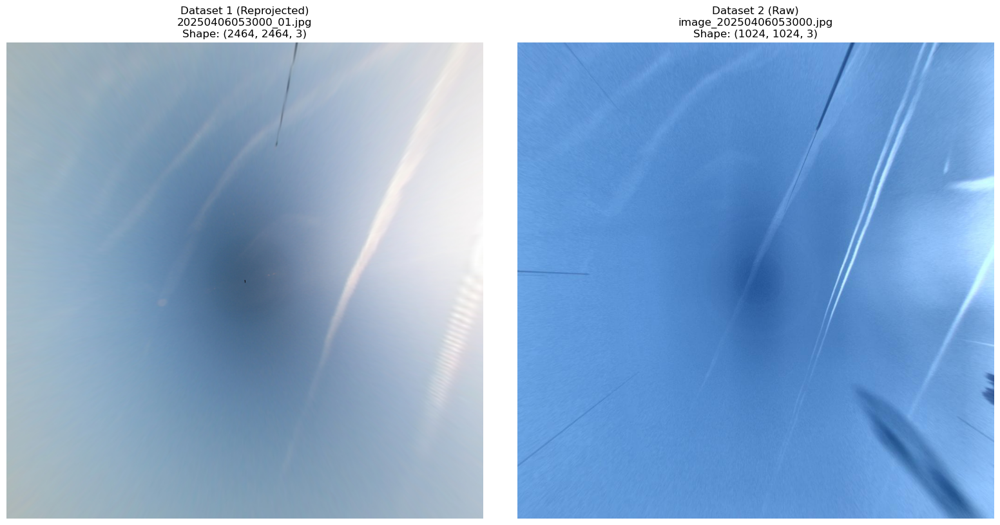

In [ ]:
def display_side_by_side(img1_path, img2_path, title1="Dataset 1 (Reprojected)", title2="Dataset 2 (Raw)", apply_matching=None):
    """Display two images side by side."""
    # Load images
    img1 = load_image(img1_path)
    img2 = load_image(img2_path)
    
    if img1 is None or img2 is None:
        print("Error loading images")
        return
    
    # Flip img1 vertically
    img1 = cv2.flip(img1, 0)
    
    # Apply histogram matching if enabled
    if apply_matching is None:
        apply_matching = USE_HISTOGRAM_MATCHING
    
    if apply_matching and 'reference_image' in globals() and reference_image is not None:
        img1_display = match_histogram(img1, reference_image)
        title1 += "\n[Histogram Matched]"
    else:
        img1_display = img1
    
    # Create figure
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    
    # Display images
    axes[0].imshow(img1_display, cmap='gray' if len(img1_display.shape) == 2 else None)
    axes[0].set_title(f"{title1}\n{os.path.basename(img1_path)}\nShape: {img1_display.shape}")
    axes[0].axis('off')
    
    axes[1].imshow(img2, cmap='gray' if len(img2.shape) == 2 else None)
    axes[1].set_title(f"{title2}\n{os.path.basename(img2_path)}\nShape: {img2.shape}")
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()

# Initialize reference_image as None
reference_image = None

# Display first pair if available
if dataset1_images and dataset2_images:
    print("Displaying first image pair...")
    display_side_by_side(dataset1_images[12], dataset2_images[20])
else:
    print("Not enough images to display")

if dataset1_images and dataset2_images:
    print("Displaying first image pair...")
    display_side_by_side(dataset1_images[20], dataset2_images[52])
else:
    print("Not enough images to display")

if dataset1_images and dataset2_images:
    print("Displaying first image pair...")
    display_side_by_side(dataset1_images[22], dataset2_images[60])
else:
    print("Not enough images to display")

In [70]:
# Histogram Matching Implementation

from skimage import exposure
from tqdm import tqdm

def compute_color_histogram(image_paths: List[str], num_samples: int = 50) -> np.ndarray:
    """
    Compute average color histogram from a sample of images.
    
    Args:
        image_paths: List of image file paths
        num_samples: Number of images to sample for histogram computation
        
    Returns:
        Representative image for histogram matching (averaged)
    """
    if len(image_paths) == 0:
        print("Error: No images provided")
        return None
    
    samples = min(num_samples, len(image_paths))
    sampled_paths = np.random.choice(image_paths, samples, replace=False)
    
    all_images = []
    print(f"Computing color histogram from {samples} sample images...")
    
    for path in tqdm(sampled_paths, desc="Loading samples"):
        try:
            img = Image.open(path)
            # Convert to RGB if needed
            if img.mode != 'RGB':
                img = img.convert('RGB')
            img_array = np.array(img)
            
            # Ensure image has valid shape
            if len(img_array.shape) == 3 and img_array.shape[2] == 3:
                all_images.append(img_array)
            else:
                print(f"Skipping {os.path.basename(path)}: invalid shape {img_array.shape}")
        except Exception as e:
            print(f"Error loading {os.path.basename(path)}: {e}")
            continue
    
    if not all_images:
        print("Error: No valid images loaded")
        return None
    
    print(f"Successfully loaded {len(all_images)} images")
    
    # Find common dimensions (use the most common size)
    shapes = [img.shape for img in all_images]
    from collections import Counter
    most_common_shape = Counter(shapes).most_common(1)[0][0]
    print(f"Using shape: {most_common_shape}")
    
    # Filter images to match common shape
    filtered_images = [img for img in all_images if img.shape == most_common_shape]
    
    if not filtered_images:
        print("Error: No images with matching dimensions")
        return None
    
    # Compute mean image as reference
    mean_image = np.mean(filtered_images, axis=0).astype(np.uint8)
    return mean_image


def match_histogram(img1, img2) -> np.ndarray:
    """
    Match the histogram of source image to reference image.
    
    Args:
        source_image: Image to transform (RGB)
        reference_image: Reference image with target histogram (RGB)
        
    Returns:
        Histogram-matched image
    """
    # Load images if they are file paths
    def load_img(img):
        if isinstance(img, str):
            # It's a file path
            loaded = Image.open(img)
            if loaded.mode != 'RGB':
                loaded = loaded.convert('RGB')
            return np.array(loaded)
        else:
            # Already a numpy array
            return img
    
    img1_array = load_img(img1)
    img2_array = load_img(img2)
    
    # Apply histogram matching per channel
    matched = exposure.match_histograms(img1_array, img2_array, channel_axis=2)
    return matched.astype(np.uint8)


def visualize_histograms(img1, img2, img2_matched=None):
    """
    Visualize color histograms for comparison.
    
    Args:
        img1: Dataset 1 image (file path or numpy array)
        img2: Dataset 2 original image (file path or numpy array)
        img2_matched: Dataset 2 image after histogram matching (file path or numpy array, optional)
    """
    # Load images if they are file paths
    def load_img(img):
        if isinstance(img, str):
            # It's a file path
            loaded = Image.open(img)
            if loaded.mode != 'RGB':
                loaded = loaded.convert('RGB')
            return np.array(loaded)
        else:
            # Already a numpy array
            return img
    
    img1_array = load_img(img1)
    img2_array = load_img(img2)
    img2_matched_array = load_img(img2_matched) if img2_matched is not None else None
    
    colors = ['red', 'green', 'blue']
    labels = ['Red', 'Green', 'Blue']
    
    num_plots = 3 if img2_matched_array is not None else 2
    fig, axes = plt.subplots(2, num_plots, figsize=(6*num_plots, 8))
    
    # Show images
    axes[0, 0].imshow(img1_array)
    axes[0, 0].set_title('Dataset 1 (Reference)', fontweight='bold')
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(cv2.flip(img2_array, 0))
    axes[0, 1].set_title('Dataset 2 (Original)', fontweight='bold')
    axes[0, 1].axis('off')
    
    if img2_matched_array is not None:
        axes[0, 2].imshow(img2_matched_array)
        axes[0, 2].set_title('Dataset 2 (Matched)', fontweight='bold')
        axes[0, 2].axis('off')
    
    # Plot histograms
    for i, (color, label) in enumerate(zip(colors, labels)):
        # Dataset 1 histogram
        hist1, bins1 = np.histogram(img1_array[:,:,i].flatten(), bins=256, range=(0, 256))
        axes[1, 0].plot(bins1[:-1], hist1, color=color, alpha=0.7, label=label)
        
        # Dataset 2 original histogram
        hist2, bins2 = np.histogram(img2_array[:,:,i].flatten(), bins=256, range=(0, 256))
        axes[1, 1].plot(bins2[:-1], hist2, color=color, alpha=0.7, label=label)
        
        # Dataset 2 matched histogram
        if img2_matched_array is not None:
            hist3, bins3 = np.histogram(img2_matched_array[:,:,i].flatten(), bins=256, range=(0, 256))
            axes[1, 2].plot(bins3[:-1], hist3, color=color, alpha=0.7, label=label)
    
    axes[1, 0].set_title('Dataset 1 Histogram')
    axes[1, 0].set_xlabel('Pixel Value')
    axes[1, 0].set_ylabel('Frequency')
    axes[1, 0].legend()
    axes[1, 0].grid(alpha=0.3)
    
    axes[1, 1].set_title('Dataset 2 Original Histogram')
    axes[1, 1].set_xlabel('Pixel Value')
    axes[1, 1].set_ylabel('Frequency')
    axes[1, 1].legend()
    axes[1, 1].grid(alpha=0.3)
    
    if img2_matched_array is not None:
        axes[1, 2].set_title('Dataset 2 Matched Histogram')
        axes[1, 2].set_xlabel('Pixel Value')
        axes[1, 2].set_ylabel('Frequency')
        axes[1, 2].legend()
        axes[1, 2].grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()

print("✓ Histogram matching functions defined")

✓ Histogram matching functions defined


In [ ]:
# Dataset Discovery and Preparation for Histogram Matching

# Initialize reference images as None
reference_image_dataset1 = None
reference_image_dataset2 = None

def find_dataset1_images(base_path: str) -> List[str]:
    pattern = os.path.join(base_path, "*_01.jpg")
    images = sorted(glob.glob(pattern))
    print(f"Found {len(images)} images ending in '_01.jpg'")
    return images


def find_dataset2_images(base_path: str) -> List[str]:
    pattern = os.path.join(base_path, "image_*.jpg")
    all_images = glob.glob(pattern)
    even_minute_images = []
    
    for img_path in all_images:
        filename = os.path.basename(img_path)
        # Extract timestamp from filename
        match = re.search(r'image_(\d{14})\.jpg', filename)
        if match:
            timestamp = match.group(1)
            # Extract minutes (characters 10-12 in YYYYMMDDHHMMSS)
            minutes = int(timestamp[10:12])
            # Check if even minute
            if minutes % 2 == 0:
                even_minute_images.append(img_path)
    
    even_minute_images.sort()
    print(f"Found {len(even_minute_images)} images with even minute timestamps (out of {len(all_images)} total)")
    return even_minute_images


# Discover images in parallel
print("="*60)
print("STEP 1: Discovering Images")
print("="*60)

with ThreadPoolExecutor(max_workers=2) as executor:
    future_dataset1 = executor.submit(find_dataset1_images, DATASET1_PATH)
    future_dataset2 = executor.submit(find_dataset2_images, DATASET2_PATH)
    
    dataset1_image_paths = future_dataset1.result()
    dataset2_image_paths = future_dataset2.result()

print(f"\nDataset 1: {len(dataset1_image_paths)} images found")
print(f"Dataset 2: {len(dataset2_image_paths)} images found")

# Create dataset objects
dataset1 = {
    'name': 'Dataset 1 (IPSL)',
    'path': DATASET1_PATH,
    'image_paths': dataset1_image_paths,
    'count': len(dataset1_image_paths)
}

dataset2 = {
    'name': 'Dataset 2 (ECTL)',
    'path': DATASET2_PATH,
    'image_paths': dataset2_image_paths,
    'count': len(dataset2_image_paths)
}

print(f"\n{'='*60}")
print("STEP 2: Computing Reference Histograms")
print("="*60)

if USE_HISTOGRAM_MATCHING and dataset1['count'] > 0 and dataset2['count'] > 0:
    # Set random seed for reproducibility
    np.random.seed(42)
    
    # Compute reference images for histogram matching
    print(f"\n{dataset1['name']}:")
    reference_image_dataset1 = compute_color_histogram(dataset1['image_paths'], num_samples=1)
    
    print(f"\n{dataset2['name']}:")
    reference_image_dataset2 = compute_color_histogram(dataset2['image_paths'], num_samples=1)
    
    # Store in dataset objects
    dataset1['reference_histogram'] = reference_image_dataset1
    dataset2['reference_histogram'] = reference_image_dataset2
    
    # Set global reference_image for display functions
    reference_image = reference_image_dataset2
    
    if reference_image_dataset1 is not None and reference_image_dataset2 is not None:
        print(f"\n{'='*60}")
        print("✓ Success!")
        print("="*60)
        print(f"Dataset 1 reference shape: {reference_image_dataset1.shape}")
        print(f"Dataset 2 reference shape: {reference_image_dataset2.shape}")
        print("\nHistogram computation complete. You can now use these for matching.")
    else:
        print("\n✗ Failed to compute reference histograms")
        if reference_image_dataset1 is None:
            print("  - Dataset 1 histogram failed")
        if reference_image_dataset2 is None:
            print("  - Dataset 2 histogram failed")
elif not USE_HISTOGRAM_MATCHING:
    print("\nHistogram matching is DISABLED. Skipping reference histogram computation.")
    print("Set USE_HISTOGRAM_MATCHING = True to enable.")
else:
    print("\n✗ Cannot compute histograms: one or both datasets are empty")

STEP 1: Discovering Images
Found 427 images ending in '_01.jpg'
Found 721 images with even minute timestamps (out of 1441 total)

Dataset 1: 427 images found
Dataset 2: 721 images found

STEP 2: Computing Reference Histograms

Dataset 1 (IPSL):
Computing color histogram from 1 sample images...


Loading samples: 100%|██████████| 1/1 [00:00<00:00, 15.73it/s]


Successfully loaded 1 images
Using shape: (2464, 2464, 3)

Dataset 2 (ECTL):
Computing color histogram from 1 sample images...


Loading samples: 100%|██████████| 1/1 [00:00<00:00, 91.79it/s]

Successfully loaded 1 images
Using shape: (1024, 1024, 3)

✓ Success!
Dataset 1 reference shape: (2464, 2464, 3)
Dataset 2 reference shape: (1024, 1024, 3)

Histogram computation complete. You can now use these for matching.


Comparing original color distributions:


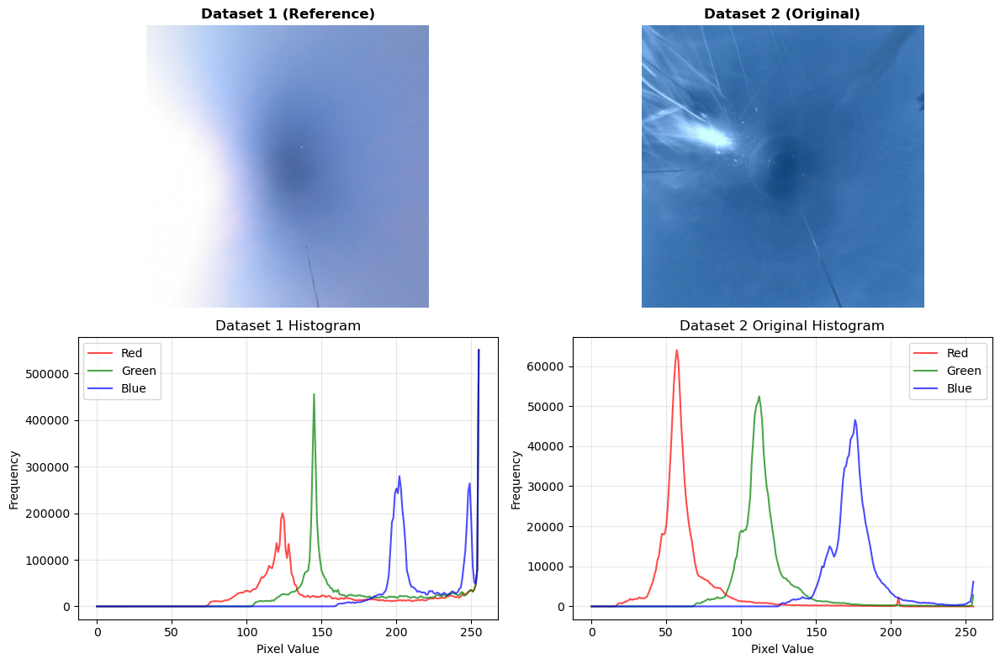

In [ ]:
# Visualize the original color distributions before matching
if USE_HISTOGRAM_MATCHING:
    if reference_image_dataset1 is not None and reference_image_dataset2 is not None:
        print("Comparing original color distributions:")
        visualize_histograms(reference_image_dataset1, reference_image_dataset2)
    else:
        print("Cannot visualize - reference images not available")
else:
    print("Histogram matching is DISABLED. Skipping visualization.")
    print("Set USE_HISTOGRAM_MATCHING = True to enable.")

Comparing original color distributions:


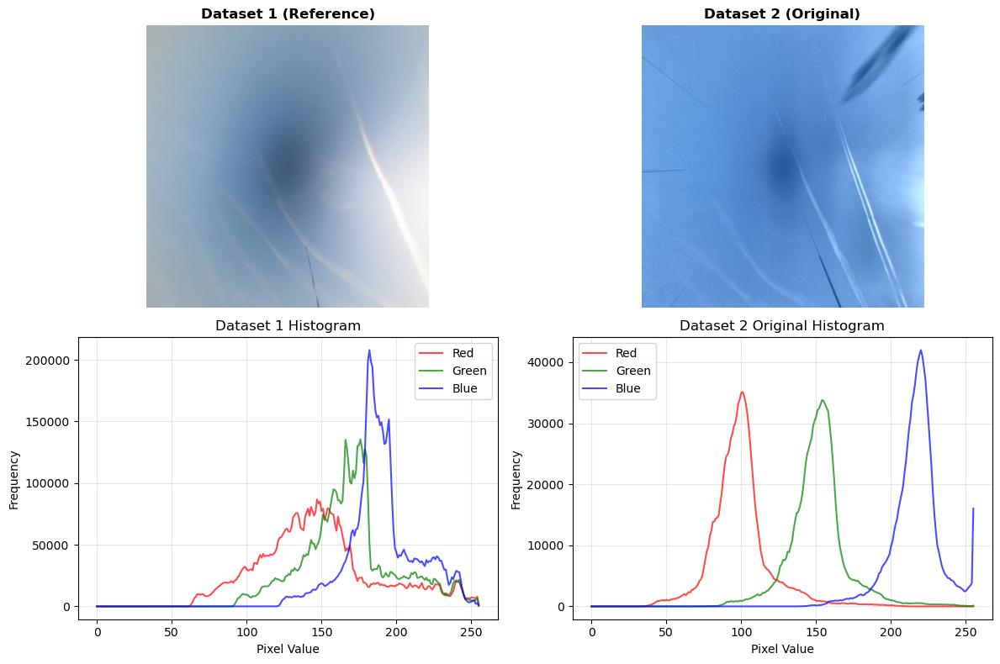

In [ ]:
# Visualize the original color distributions before matching
if USE_HISTOGRAM_MATCHING:
    if reference_image_dataset1 is not None and reference_image_dataset2 is not None:
        print("Comparing original color distributions:")
        visualize_histograms(dataset1_images[20], dataset2_images[52])
    else:
        print("Cannot visualize - reference images not available")
else:
    print("Histogram matching is DISABLED. Skipping visualization.")
    print("Set USE_HISTOGRAM_MATCHING = True to enable.")

## Matching the first histogram to the second

Testing histogram matching transformation...
✓ Histogram matching applied

Visualizing before and after matching:


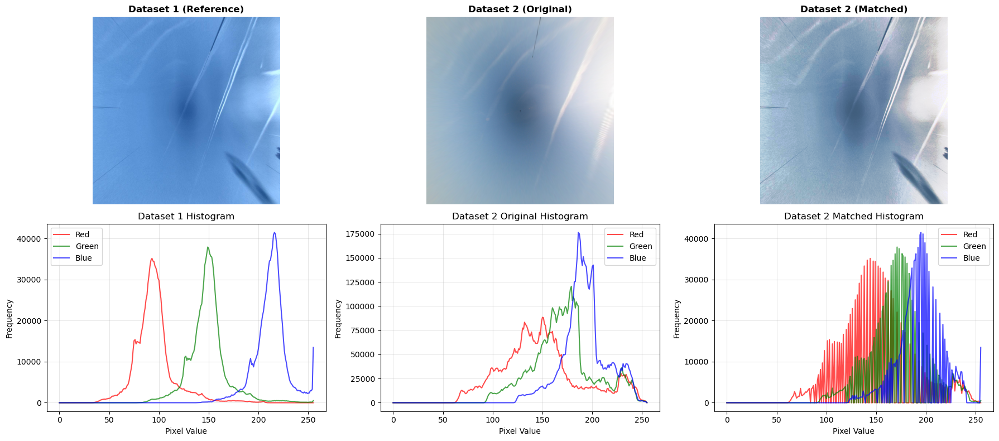

Testing histogram matching transformation...
✓ Histogram matching applied

Visualizing before and after matching:


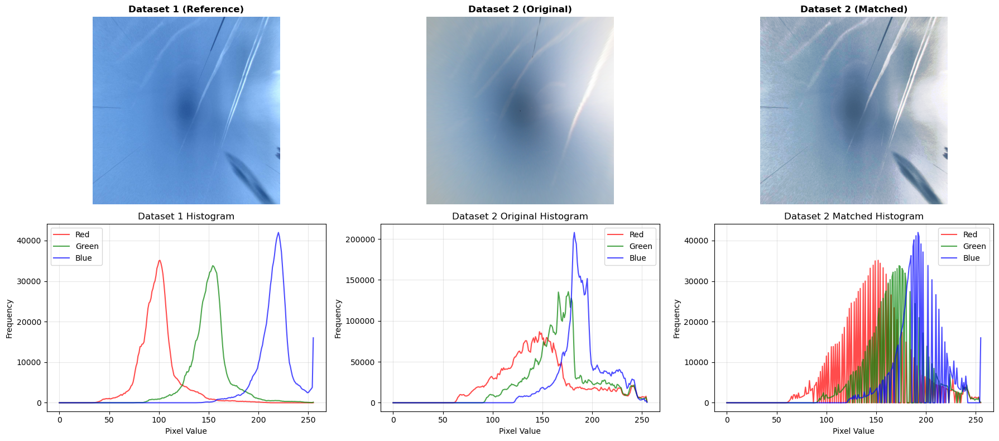

error: OpenCV(4.10.0) :-1: error: (-5:Bad argument) in function 'cvtColor'
> Overload resolution failed:
>  - cvtColor() missing required argument 'code' (pos 2)
>  - cvtColor() missing required argument 'code' (pos 2)


In [ ]:
# Test histogram matching on sample images
if USE_HISTOGRAM_MATCHING:
    if reference_image_dataset1 is not None and reference_image_dataset2 is not None:
        print("Testing histogram matching transformation...")
        
        # Apply histogram matching
        matched_reference = match_histogram(dataset2_images[60], dataset1_images[22])
        
        print("✓ Histogram matching applied")
        print("\nVisualizing before and after matching:")
        visualize_histograms(dataset2_images[60], dataset1_images[22], matched_reference)
    else:
        print("Cannot test histogram matching - reference images not available")

    if reference_image_dataset1 is not None and reference_image_dataset2 is not None:
        print("Testing histogram matching transformation...")
        
        # Apply histogram matching
        matched_reference = match_histogram(dataset1_images[20], dataset2_images[52])
        
        print("✓ Histogram matching applied")
        print("\nVisualizing before and after matching:")
        visualize_histograms(dataset1_images[20], dataset2_images[52], matched_reference)
else:
    print("Histogram matching is DISABLED. Skipping histogram matching tests.")
    print("Set USE_HISTOGRAM_MATCHING = True in cell 2 to enable.")

# # save the images for matching
# # Save original IPSL image
# cv2.imwrite("/data/common/STEREOSTUDYIPSL/Codebase/data/matched_IPSL.jpg", 
#             cv2.cvtColor(cv2.imread(dataset1_images[20])))
# # Save matched ECTL image (matched_reference is already a numpy array)
# cv2.imwrite("/data/common/STEREOSTUDYIPSL/Codebase/data/matched_ECTL.jpg", 
#             cv2.cvtColor(matched_reference, cv2.COLOR_RGB2BGR))

## 5. Interactive Image Browser

In [20]:
def browse_image_pair(idx1=0, idx2=0):
    """Browse images by index."""
    if not dataset1_images or not dataset2_images:
        print("No images available")
        return
    
    idx1 = max(0, min(idx1, len(dataset1_images) - 1))
    idx2 = max(0, min(idx2, len(dataset2_images) - 1))
    
    print(f"\nShowing Dataset1[{idx1}/{len(dataset1_images)-1}] vs Dataset2[{idx2}/{len(dataset2_images)-1}]")
    display_side_by_side(dataset1_images[idx1], dataset2_images[idx2])

# Browse first few pairs
print("Browse images by calling: browse_image_pair(idx1, idx2)")
print(f"Dataset 1 has {len(dataset1_images)} images (index 0 to {len(dataset1_images)-1})")
print(f"Dataset 2 has {len(dataset2_images)} images (index 0 to {len(dataset2_images)-1})")

Browse images by calling: browse_image_pair(idx1, idx2)
Dataset 1 has 427 images (index 0 to 426)
Dataset 2 has 1441 images (index 0 to 1440)


## 6. Parse filenames to extract timestamp

In [21]:
def extract_date_and_time_from_IPSL(filename):
    """Extract date and time (as seconds) from filename format: YYYYMMDDHHMMSS_XX.jpg

    Returns:
        tuple of (date_string, time_in_seconds) or (None, None) if format doesn't match
    """   

    # Pattern for YYYYMMDDHHMMSS
    pattern = r'(\d{4})(\d{2})(\d{2})(\d{2})(\d{2})(\d{2})'
    match = re.search(pattern, filename)
    
    if match:
        year = match.group(1)
        month = match.group(2)
        day = match.group(3)
        hour = int(match.group(4))
        minute = int(match.group(5))
        second = int(match.group(6))
        
        date_str = f"{year}-{month}-{day}"
        time_seconds = hour * 3600 + minute * 60 + second
        
        return date_str, time_seconds
    
    return None, None

def extract_date_and_time_from_image_ECTL(filename):
    """Extract date and time (as seconds) from filename format: image_YYYYMMDDHHMMSS.jp2

    Returns:
        tuple of (date_string, time_in_seconds) or (None, None) if format doesn't match
    """

    pattern = r'image_(\d{4})(\d{2})(\d{2})(\d{2})(\d{2})(\d{2})'
    match = re.search(pattern, filename)
    
    if match:
        year = match.group(1)
        month = match.group(2)
        day = match.group(3)
        hour = int(match.group(4))
        minute = int(match.group(5))
        second = int(match.group(6))
        
        date_str = f"{year}-{month}-{day}"
        time_seconds = hour * 3600 + minute * 60 + second
        
        return date_str, time_seconds
    
    return None, None

# Test the function
# test_filename = "20250406044600_01.jpg"
# date, time_sec = extract_date_and_time_from_IPSL(test_filename)
# if date:
#     print(f"Test filename: {test_filename}")
#     print(f"  Date: {date}")
#     print(f"  Time (seconds from midnight): {time_sec}")
#     print(f"  Time (hours): {time_sec / 3600:.2f}")
# else:
#     print("No match found")

In [22]:
# Parse timestamps from both datasets in parallel
dataset1_parsed = []
dataset2_parsed = []

print("Parsing Dataset 1 filenames...")
for img_path in dataset1_images:
    filename = os.path.basename(img_path)
    date, time_sec = extract_date_and_time_from_IPSL(filename)
    if date:
        dataset1_parsed.append({
            'path': img_path,
            'filename': filename,
            'date': date,
            'time_seconds': time_sec
        })

print("Parsing Dataset 2 filenames...")
for img_path in dataset2_images:
    filename = os.path.basename(img_path)
    date, time_sec = extract_date_and_time_from_image_ECTL(filename)
    if date:
        dataset2_parsed.append({
            'path': img_path,
            'filename': filename,
            'date': date,
            'time_seconds': time_sec
        })

print(f"\nDataset 1: {len(dataset1_parsed)}/{len(dataset1_images)} images parsed successfully")
print(f"Dataset 2: {len(dataset2_parsed)}/{len(dataset2_images)} images parsed successfully")

# Match images with the same timestamp (date + time in seconds)
matched_image_pairs = []

for item1 in dataset1_parsed:
    for item2 in dataset2_parsed:
        # Check if date and time match exactly
        if item1['date'] == item2['date'] and item1['time_seconds'] == item2['time_seconds']:
            matched_image_pairs.append({
                'dataset1_path': item1['path'],
                'dataset1_filename': item1['filename'],
                'dataset2_path': item2['path'],
                'dataset2_filename': item2['filename'],
                'date': item1['date'],
                'time_seconds': item1['time_seconds']
            })
            break  # Move to next item1 after finding a match

print(f"\nFound {len(matched_image_pairs)} image pairs with matching timestamps")

# Display first 5 matched pairs info
if matched_image_pairs:
    print("\nFirst 5 matched pairs:")
    for i, pair in enumerate(matched_image_pairs[:5]):
        hours = pair['time_seconds'] // 3600
        minutes = (pair['time_seconds'] % 3600) // 60
        seconds = pair['time_seconds'] % 60
        print(f"\nPair {i+1}:")
        print(f"  Date: {pair['date']}, Time: {hours:02d}:{minutes:02d}:{seconds:02d}")
        print(f"  Dataset 1: {pair['dataset1_filename']}")
        print(f"  Dataset 2: {pair['dataset2_filename']}")
else:
    print("\nNo matched pairs found!")

Parsing Dataset 1 filenames...
Parsing Dataset 2 filenames...

Dataset 1: 427/427 images parsed successfully
Dataset 2: 1441/1441 images parsed successfully

Found 361 image pairs with matching timestamps

First 5 matched pairs:

Pair 1:
  Date: 2025-04-06, Time: 05:00:00
  Dataset 1: 20250406050000_01.jpg
  Dataset 2: image_20250406050000.jpg

Pair 2:
  Date: 2025-04-06, Time: 05:02:00
  Dataset 1: 20250406050200_01.jpg
  Dataset 2: image_20250406050200.jpg

Pair 3:
  Date: 2025-04-06, Time: 05:04:00
  Dataset 1: 20250406050400_01.jpg
  Dataset 2: image_20250406050400.jpg

Pair 4:
  Date: 2025-04-06, Time: 05:06:00
  Dataset 1: 20250406050600_01.jpg
  Dataset 2: image_20250406050600.jpg

Pair 5:
  Date: 2025-04-06, Time: 05:08:00
  Dataset 1: 20250406050800_01.jpg
  Dataset 2: image_20250406050800.jpg


Displaying first 5 matched pairs out of 361 total matches


Pair 1/5
Timestamp: 2025-04-06 05:00:00


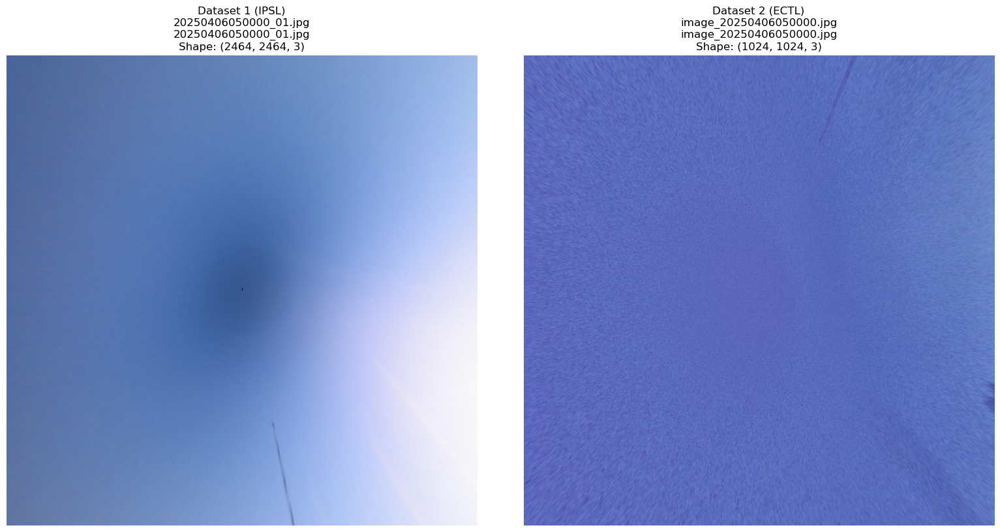


Pair 2/5
Timestamp: 2025-04-06 05:02:00


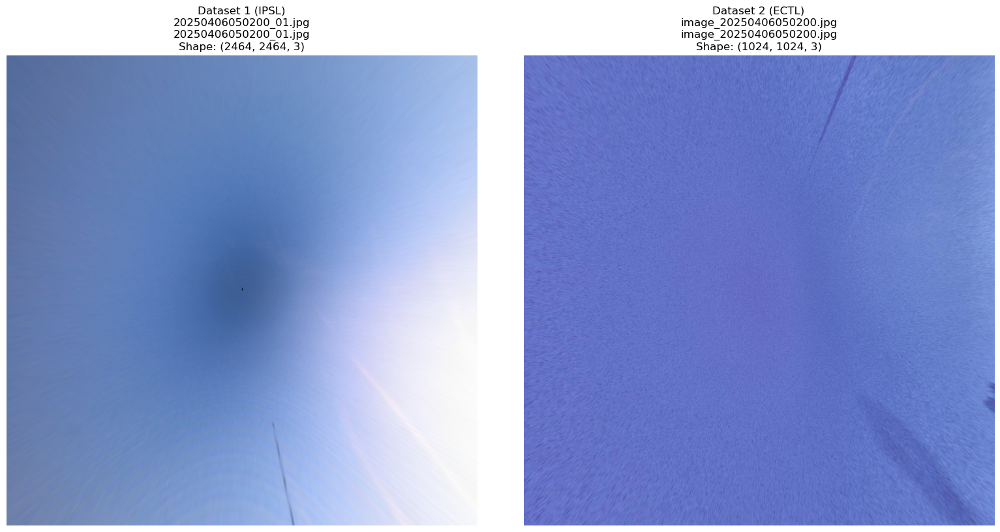


Pair 3/5
Timestamp: 2025-04-06 05:04:00


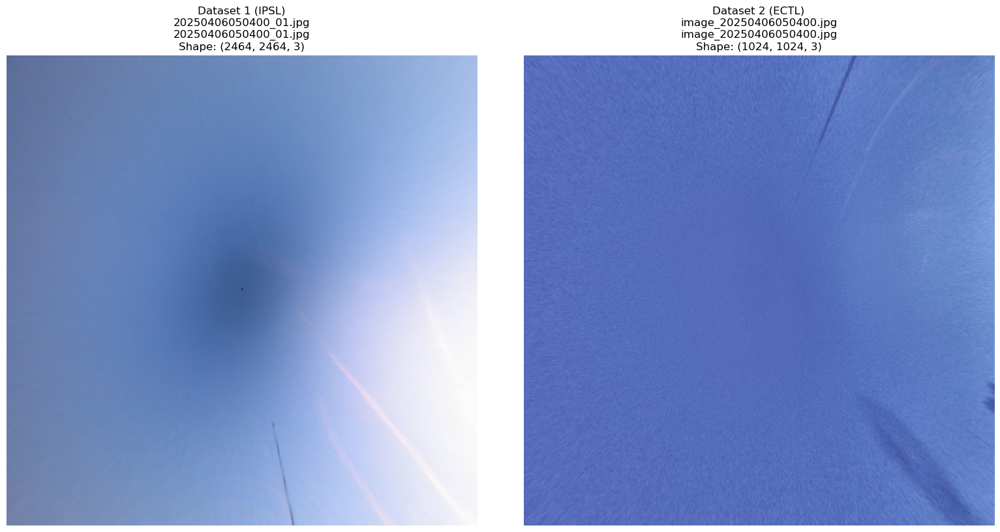


Pair 4/5
Timestamp: 2025-04-06 05:06:00


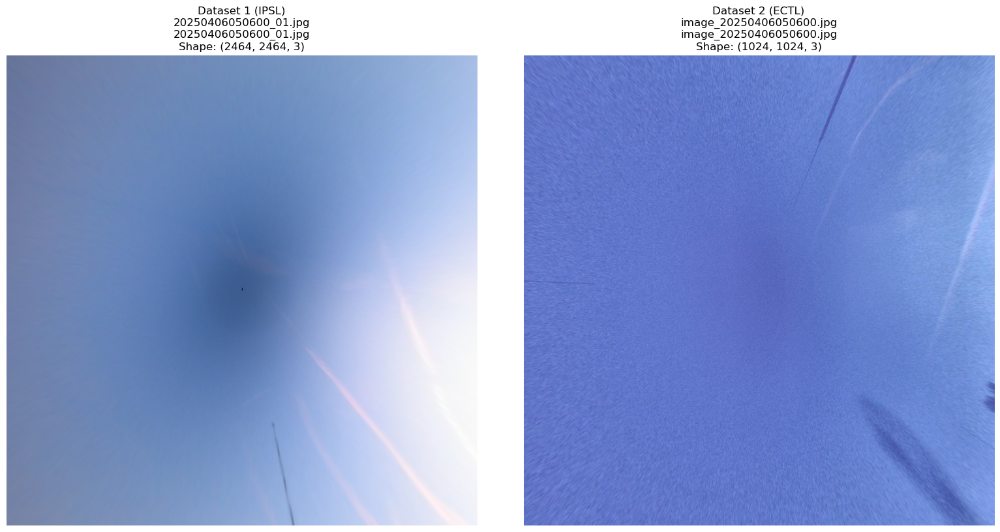


Pair 5/5
Timestamp: 2025-04-06 05:08:00


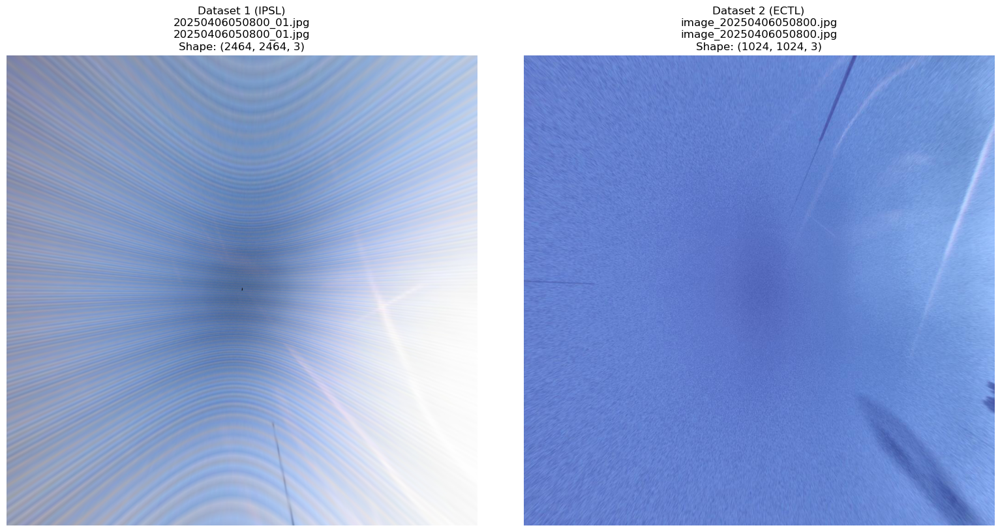

In [23]:
# Display first 5 matched pairs visually
if matched_image_pairs:
    print(f"Displaying first 5 matched pairs out of {len(matched_image_pairs)} total matches\n")
    
    for i, pair in enumerate(matched_image_pairs[:5]):
        hours = pair['time_seconds'] // 3600
        minutes = (pair['time_seconds'] % 3600) // 60
        seconds = pair['time_seconds'] % 60
        timestamp_str = f"{pair['date']} {hours:02d}:{minutes:02d}:{seconds:02d}"
        
        print(f"\n{'='*60}")
        print(f"Pair {i+1}/{min(5, len(matched_image_pairs))}")
        print(f"Timestamp: {timestamp_str}")
        print(f"{'='*60}")
        
        display_side_by_side(
            pair['dataset1_path'],
            pair['dataset2_path'],
            title1=f"Dataset 1 (IPSL)\n{pair['dataset1_filename']}",
            title2=f"Dataset 2 (ECTL)\n{pair['dataset2_filename']}"
        )
else:
    print("No matched pairs to display")

## 7. Find Temporally Matched Pairs

In [ ]:
def find_closest_match(target_time, dataset_with_time, max_diff_seconds=60):
    """Find closest temporal match within max_diff_seconds."""
    if target_time is None:
        return None
    
    best_match = None
    best_diff = float('inf')
    
    for item in dataset_with_time:
        if item['timestamp'] is None:
            continue
        
        diff = abs((item['timestamp'] - target_time).total_seconds())
        if diff < best_diff and diff <= max_diff_seconds:
            best_diff = diff
            best_match = item
    
    return best_match, best_diff if best_match else None

# Find matched pairs
matched_pairs = []
for item1 in dataset1_with_time:
    if item1['timestamp'] is None:
        continue
    
    result = find_closest_match(item1['timestamp'], dataset2_with_time, max_diff_seconds=300)
    if result[0] is not None:
        matched_pairs.append({
            'dataset1': item1['path'],
            'dataset2': result[0]['path'],
            'time_diff_seconds': result[1],
            'timestamp1': item1['timestamp'],
            'timestamp2': result[0]['timestamp']
        })

print(f"\nFound {len(matched_pairs)} temporally matched pairs (within 5 minutes)")

if matched_pairs:
    print("\nFirst 5 matched pairs:")
    for i, pair in enumerate(matched_pairs[:5]):
        print(f"\nPair {i+1}:")
        print(f"  Dataset 1: {os.path.basename(pair['dataset1'])}")
        print(f"  Dataset 2: {os.path.basename(pair['dataset2'])}")
        print(f"  Time difference: {pair['time_diff_seconds']:.1f} seconds")

## 8. Display Matched Pairs

In [ ]:
def display_matched_pair(pair_idx=0):
    """Display a matched pair by index."""
    if not matched_pairs:
        print("No matched pairs available")
        return
    
    if pair_idx < 0 or pair_idx >= len(matched_pairs):
        print(f"Invalid index. Use 0 to {len(matched_pairs)-1}")
        return
    
    pair = matched_pairs[pair_idx]
    
    print(f"\nMatched Pair {pair_idx+1}/{len(matched_pairs)}")
    print(f"Time difference: {pair['time_diff_seconds']:.1f} seconds")
    print(f"Dataset 1 time: {pair['timestamp1']}")
    print(f"Dataset 2 time: {pair['timestamp2']}")
    
    display_side_by_side(
        pair['dataset1'], 
        pair['dataset2'],
        title1=f"Dataset 1 (Reprojected)\n{pair['timestamp1']}",
        title2=f"Dataset 2 (Raw)\n{pair['timestamp2']}"
    )

# Display first matched pair if available
if matched_pairs:
    display_matched_pair(0)
else:
    print("No temporally matched pairs found.")
    print("You can still browse images manually using browse_image_pair(idx1, idx2)")

## 9. Image Statistics and Comparison

In [ ]:
def compare_images(img1_path, img2_path):
    """Compare two images statistically."""
    img1 = load_image(img1_path)
    img2 = load_image(img2_path)
    
    if img1 is None or img2 is None:
        return None
    
    # Convert to grayscale if needed for comparison
    if len(img1.shape) == 3:
        img1_gray = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
    else:
        img1_gray = img1
    
    if len(img2.shape) == 3:
        img2_gray = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)
    else:
        img2_gray = img2
    
    stats = {
        'img1_shape': img1.shape,
        'img2_shape': img2.shape,
        'img1_mean': np.mean(img1_gray),
        'img2_mean': np.mean(img2_gray),
        'img1_std': np.std(img1_gray),
        'img2_std': np.std(img2_gray),
        'img1_min': np.min(img1_gray),
        'img2_min': np.min(img2_gray),
        'img1_max': np.max(img1_gray),
        'img2_max': np.max(img2_gray),
    }
    
    return stats

# Compare first matched pair
if matched_pairs:
    print("Comparing first matched pair...")
    stats = compare_images(matched_pairs[0]['dataset1'], matched_pairs[0]['dataset2'])
    if stats:
        print("\nImage Statistics:")
        print(f"  Dataset 1 shape: {stats['img1_shape']}")
        print(f"  Dataset 2 shape: {stats['img2_shape']}")
        print(f"\n  Dataset 1 intensity: mean={stats['img1_mean']:.2f}, std={stats['img1_std']:.2f}, range=[{stats['img1_min']}, {stats['img1_max']}]")
        print(f"  Dataset 2 intensity: mean={stats['img2_mean']:.2f}, std={stats['img2_std']:.2f}, range=[{stats['img2_min']}, {stats['img2_max']}]")
elif dataset1_images and dataset2_images:
    print("Comparing first images from each dataset...")
    stats = compare_images(dataset1_images[0], dataset2_images[0])
    if stats:
        print("\nImage Statistics:")
        print(f"  Dataset 1 shape: {stats['img1_shape']}")
        print(f"  Dataset 2 shape: {stats['img2_shape']}")
        print(f"\n  Dataset 1 intensity: mean={stats['img1_mean']:.2f}, std={stats['img1_std']:.2f}, range=[{stats['img1_min']}, {stats['img1_max']}]")
        print(f"  Dataset 2 intensity: mean={stats['img2_mean']:.2f}, std={stats['img2_std']:.2f}, range=[{stats['img2_min']}, {stats['img2_max']}]")

## 10. Summary and Next Steps

In [ ]:
print("=" * 60)
print("SUMMARY")
print("=" * 60)
print(f"Dataset 1 (Reprojected): {len(dataset1_images)} images")
print(f"Dataset 2 (Raw): {len(dataset2_images)} images")
print(f"Temporally matched pairs: {len(matched_pairs)}")
print("\n" + "=" * 60)
print("AVAILABLE FUNCTIONS")
print("=" * 60)
print("1. browse_image_pair(idx1, idx2) - Browse images by index")
print("2. display_matched_pair(pair_idx) - Display temporally matched pair")
print("3. compare_images(img1_path, img2_path) - Get image statistics")
print("\n" + "=" * 60)
print("NEXT STEPS")
print("=" * 60)
print("- Perform feature matching between image pairs")
print("- Calculate cloud heights using stereo matching")
print("- Analyze temporal evolution of cloud patterns")
print("- Export matched pairs for further processing")